<a href="https://colab.research.google.com/github/LucaFedericoMarty/TP-T.E-IA/blob/main/Vegetable_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Importacion y Set Up

### TPU

Corro un codigo para poder **detectar** si el entorno de Colab esta utilizando una TPU y si asi lo esta haciendo, que **version** de la misma

Utilizamos **TPUs** *(Tensor Proccesor Units)* puesto que este es un **hardware especializado** para **procesar tensores**, los cuales son los tipos de datos que le enviamos a la IA. Por esto, utilizando TPUs, podemos **acelearar** mucho el tiempo de entrenamiento.

In [ ]:
import tensorflow as tf
print("Tensorflow version " + tf.__version__)

try:
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection
  print('Running on TPU ', tpu.cluster_spec().as_dict()['worker'])
except ValueError:
  raise BaseException('ERROR: Not connected to a TPU runtime; please see the previous cell in this notebook for instructions!')

tf.config.experimental_connect_to_cluster(tpu)
tf.tpu.experimental.initialize_tpu_system(tpu)
tpu_strategy = tf.distribute.TPUStrategy(tpu)

Tensorflow version 2.9.2
Running on TPU  ['10.51.35.226:8470']


### Uso comun

Importo ciertas librerias las cuales son impresindibles para un modelo de IA, tales como `OS` para abrir ciertos archivos, `numpy` para hacer ciertas operaciones matematicas, entre otras.

In [1]:
import os 
import keras
import numpy as np 
import tensorflow as tf
import datetime
import pandas as pd
import cv2

### Dataset

Estos modulos de estas librerias, me permiten **cargar** y **manejar** la carga de **datos** a Colab.

In [2]:
from keras.preprocessing.image import ImageDataGenerator
from numpy import expand_dims
from tensorflow.keras.utils import load_img
from tensorflow.keras.utils import img_to_array

### Modelo

Estos modulos de keras me permiten crear mas facilmente todas aquellas **capas** y cuestiones de **configuracion** necesarias para el modelo.

In [3]:
from keras.models import Sequential, load_model
from tensorflow import keras
from tensorflow.keras import layers, callbacks
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, Dropout, Input, Activation
from tensorflow.keras.applications import VGG16

### Callbacks

Los modulos de las funciones **callbacks** que voy a utilizar para el entrenamiento

In [4]:
from keras.callbacks import EarlyStopping, ModelCheckpoint

### Graficar 

Biblotecas para graficar resultados y datos

In [5]:
!pip install keras-visualizer

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [6]:
!pip install visualkeras

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 989 kB 14.4 MB/s 


In [7]:
from matplotlib import pyplot
from matplotlib import colors
import plotly.express as px
import matplotlib.pyplot as plt
from keras.utils import plot_model
import seaborn as sn
from keras_visualizer import visualizer 
import visualkeras
from PIL import ImageFont
from PIL import Image

### Google Drive

Me conecto a Drive desde Colab, teniendo acceso a todos mis archivos de drive desde el entorno de Colab

In [8]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


[Pagina del Dataset] https://www.kaggle.com/datasets/misrakahmed/vegetable-image-dataset

Descomprimo la carpeta del dataset, la cual contine tres subcarpetas. Una es de `training`, la cual cuenta con *15000 fotos* de 15 tipos de vegetales distintos (1000 imagenes por tipo de vegetal). En cambio, la de `test` y `validation` son de *3000 imagenes cada una*, con las mismas clases, pero siendo 200 imagenes por clase.

In [9]:
!unzip gdrive/My\ Drive/ORT/TIC/T.E/Vegetable\ Data.zip

Se han truncado las últimas 5000 líneas del flujo de salida.
  inflating: Vegetable Images/train/Radish/0001.jpg  
  inflating: Vegetable Images/train/Radish/0002.jpg  
  inflating: Vegetable Images/train/Radish/0003.jpg  
  inflating: Vegetable Images/train/Radish/0004.jpg  
  inflating: Vegetable Images/train/Radish/0005.jpg  
  inflating: Vegetable Images/train/Radish/0006.jpg  
  inflating: Vegetable Images/train/Radish/0007.jpg  
  inflating: Vegetable Images/train/Radish/0008.jpg  
  inflating: Vegetable Images/train/Radish/0009.jpg  
  inflating: Vegetable Images/train/Radish/0010.jpg  
  inflating: Vegetable Images/train/Radish/0011.jpg  
  inflating: Vegetable Images/train/Radish/0012.jpg  
  inflating: Vegetable Images/train/Radish/0013.jpg  
  inflating: Vegetable Images/train/Radish/0014.jpg  
  inflating: Vegetable Images/train/Radish/0015.jpg  
  inflating: Vegetable Images/train/Radish/0016.jpg  
  inflating: Vegetable Images/train/Radish/0017.jpg  
  inflating: Vegetabl

Sabiendo que tengo 15 subdirectorios con el nombre de cada clase, recorro esos 15 subdirectorios, agarrando el nombre de cada uno, para tener una lista con todos los nombres y saber cuantos son.

In [10]:
root_path = 'Vegetable Images/train/'
class_names = sorted(os.listdir(root_path))
n_classes = len(class_names)

# Distribucion de classes
class_dis = [len(os.listdir(root_path + name)) for name in class_names]


# Muestro los datos
print(f"Numero total de clases : {n_classes} \nNombres de las clases : {class_names}")

Numero total de clases : 15 
Nombres de las clases : ['Bean', 'Bitter_Gourd', 'Bottle_Gourd', 'Brinjal', 'Broccoli', 'Cabbage', 'Capsicum', 'Carrot', 'Cauliflower', 'Cucumber', 'Papaya', 'Potato', 'Pumpkin', 'Radish', 'Tomato']


Grafico la proporcion de la cantidad de imagenes que hay por clase

In [11]:
# Creo el grafico, utilizando el nombre de la clases como labels y sus respectivas proporciones como valores

fig = px.pie(names=class_names, values=class_dis, title="Distribucion de Clases")

# Actualizo la posicion en X del titulo, para poder centrarlo con el grafico

fig.update_layout({'title':{'x':0.48}})

fig.show()

### Cargar Dataset

Creo un **preset** con el cual voy a *modificar* las **imagenes** del `dataset`. Estos **presets** son distintos tanto para los datos de `entrenamiento`, como para los de `testeo` y `validacion`. 

Para los de `entrenamiento`, para poder tener **distitnos casos** de imagenes y que no sean imagenes identicas, le agrego **rotaciones**, **cambios de brillosidad**, **distorsiones**, entre otras. Esto favorece a que el *modelo aprenda mejor*.

En los tres conjuntos de datos, se **normalizan los datos entre 0 y 1**, para que la IA sea capaz de procesar todo. Como valid y test son para testear y comprobar el modelo, estas augmentations no son necesarias. 

In [12]:
train = ImageDataGenerator(
    rescale=1./255,
    rotation_range=90,
    height_shift_range=0.5,
    width_shift_range=0.5,
    brightness_range=[0.3,1.5],
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True
)

In [13]:
valid = ImageDataGenerator(
    rescale=1./255)

In [14]:
test = ImageDataGenerator(
    rescale=1./255)

Rutas de las tres carpetas dentro de la carpeta general del dataset


In [15]:
train_path = 'Vegetable Images/train'

In [16]:
valid_path = 'Vegetable Images/validation'

In [17]:
test_path = 'Vegetable Images/test'

Cargo los datos de entrenamiento, validacion y testeo por **baches**, para no *sobrecargar la RAM*. Tambien, **desordeno las imagenes** de manera random y las resizeo a **256x256 px**. Estas imagenes las lee en forma e un array, en el que una imagen JPG tiene **tres valores** por espacio en el array representando los valores de **RGB** (rojo, verde y azul) de la foto. 

In [18]:
train_data = train.flow_from_directory(train_path, class_mode='binary', target_size=(256,256), shuffle=True, batch_size=32)

Found 15000 images belonging to 15 classes.


In [19]:
valid_data = test.flow_from_directory(valid_path, class_mode='binary', target_size=(256,256), shuffle=True, batch_size=32)

Found 3000 images belonging to 15 classes.


In [20]:
test_data = test.flow_from_directory(test_path, class_mode='binary', target_size=(256,256), shuffle=True, batch_size=32)

Found 3000 images belonging to 15 classes.


### Augmentation demostracion

Utilizando una imagen en particular, le aplico y muestro todas las modificaciones para poder visualizar que tipo de cambios se producen en las imagenes y cuanto afecta esto a las mismas.

Cambios:



*   Cambiios de brillosidad
*   Rotaciones
*   Distorciones de alto
*   Distorciones de largo
*   Distorciones angulares
*   Zooms
*   Rotaciones en horizontal
*   Rotaciones en vertical









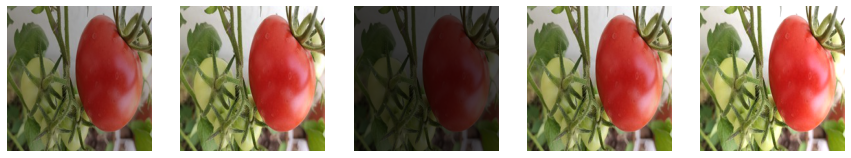

In [21]:
# Cargo la imagen
img = load_img('Vegetable Images/train/Tomato/0002.jpg')

# La convierto a un numpy array
img = img_to_array(img)

# Le sumo una dimesion, cuyo valor es cero. 
# De (224, 224, 3) a (224, 224, 3, 0)
# Esto porque la funcion flow para cargar con el iterator la imagen necesita un array de 4 dimensiones como input
img = expand_dims(img, 0)

# ImageDataGenerator brillo
datagen = ImageDataGenerator(brightness_range=[0.1,1.5])

# Iterator
aug_iter = datagen.flow(img, batch_size=1)

# Numero de imagenes para probar
n_imgs = 5

# Genero las 5 imagenes con su respectivo tamanio
fig, ax = plt.subplots(nrows=1, ncols=n_imgs, figsize=(15,15))

# Grafico las imagenes
for i in range(n_imgs):

	image = next(aug_iter)[0].astype('uint8')
 
	ax[i].imshow(image)
	ax[i].axis('off')

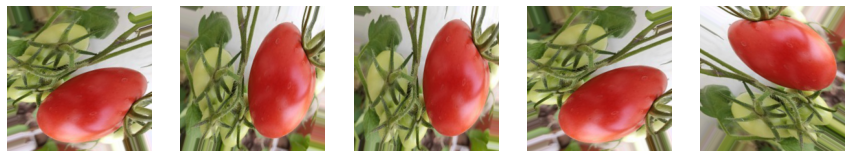

In [22]:
# Cargo la imagen
img = load_img('Vegetable Images/train/Tomato/0002.jpg')

# La convierto a un numpy array
img = img_to_array(img)

# Le sumo una dimesion, cuyo valor es cero. 
# De (224, 224, 3) a (224, 224, 3, 0)
# Esto porque la funcion flow para cargar con el iterator la imagen necesita un array de 4 dimensiones como input
img = expand_dims(img, 0)

# ImageDataGenerator brillo
datagen = ImageDataGenerator(rotation_range=90)

# Iterator
aug_iter = datagen.flow(img, batch_size=1)

# Numero de imagenes para probar
n_imgs = 5

# Genero las 5 imagenes con su respectivo tamanio
fig, ax = plt.subplots(nrows=1, ncols=n_imgs, figsize=(15,15))

# Grafico las imagenes
for i in range(n_imgs):

	image = next(aug_iter)[0].astype('uint8')

	ax[i].imshow(image)
	ax[i].axis('off')

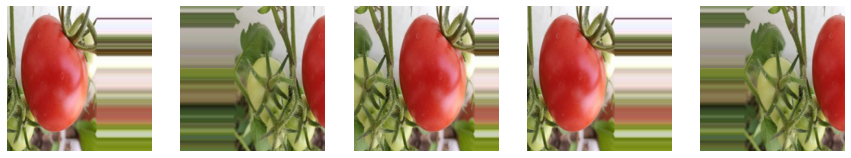

In [23]:
# Cargo la imagen
img = load_img('Vegetable Images/train/Tomato/0002.jpg')

# La convierto a un numpy array
img = img_to_array(img)

# Le sumo una dimesion, cuyo valor es cero. 
# De (224, 224, 3) a (224, 224, 3, 0)
# Esto porque la funcion flow para cargar con el iterator la imagen necesita un array de 4 dimensiones como input
img = expand_dims(img, 0)

# ImageDataGenerator brillo
datagen = ImageDataGenerator(height_shift_range=0.5)

# Iterator
aug_iter = datagen.flow(img, batch_size=1)

# Numero de imagenes para probar
n_imgs = 5

# Genero las 5 imagenes con su respectivo tamanio
fig, ax = plt.subplots(nrows=1, ncols=n_imgs, figsize=(15,15))

# Grafico las imagenes
for i in range(n_imgs):

	image = next(aug_iter)[0].astype('uint8')

	ax[i].imshow(image)
	ax[i].axis('off')

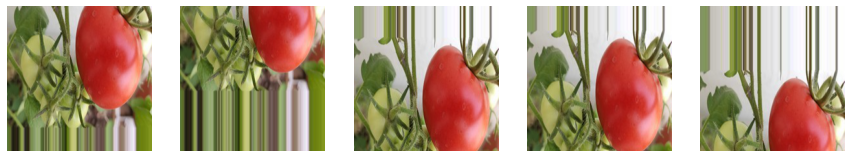

In [24]:
img = load_img('Vegetable Images/train/Tomato/0002.jpg')

# La convierto a un numpy array
img = img_to_array(img)

# Le sumo una dimesion, cuyo valor es cero. 
# De (224, 224, 3) a (224, 224, 3, 0)
# Esto porque la funcion flow para cargar con el iterator la imagen necesita un array de 4 dimensiones como input
img = expand_dims(img, 0)

# ImageDataGenerator brillo
datagen = ImageDataGenerator(width_shift_range=0.5)

# Iterator
aug_iter = datagen.flow(img, batch_size=1)

# Numero de imagenes para probar
n_imgs = 5

# Genero las 5 imagenes con su respectivo tamanio
fig, ax = plt.subplots(nrows=1, ncols=n_imgs, figsize=(15,15))

# Grafico las imagenes
for i in range(n_imgs):

	image = next(aug_iter)[0].astype('uint8')

	ax[i].imshow(image)
	ax[i].axis('off')

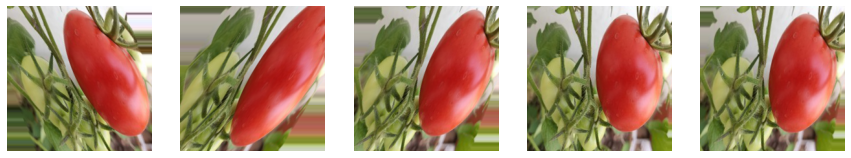

In [25]:
img = load_img('Vegetable Images/train/Tomato/0002.jpg')

# La convierto a un numpy array
img = img_to_array(img)

# Le sumo una dimesion, cuyo valor es cero. 
# De (224, 224, 3) a (224, 224, 3, 0)
# Esto porque la funcion flow para cargar con el iterator la imagen necesita un array de 4 dimensiones como input
img = expand_dims(img, 0)

# ImageDataGenerator brillo
datagen = ImageDataGenerator(shear_range=40)

# Iterator
aug_iter = datagen.flow(img, batch_size=1)

# Numero de imagenes para probar
n_imgs = 5

# Genero las 5 imagenes con su respectivo tamanio
fig, ax = plt.subplots(nrows=1, ncols=n_imgs, figsize=(15,15))

# Grafico las imagenes
for i in range(n_imgs):

	image = next(aug_iter)[0].astype('uint8')

	ax[i].imshow(image)
	ax[i].axis('off')

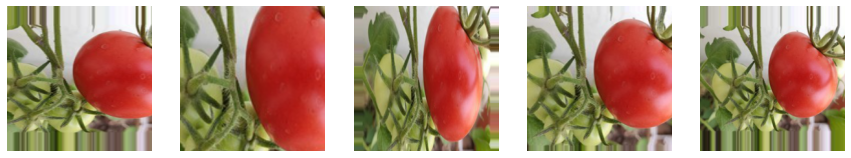

In [26]:
img = load_img('Vegetable Images/train/Tomato/0002.jpg')

# La convierto a un numpy array
img = img_to_array(img)

# Le sumo una dimesion, cuyo valor es cero. 
# De (224, 224, 3) a (224, 224, 3, 0)
# Esto porque la funcion flow para cargar con el iterator la imagen necesita un array de 4 dimensiones como input
img = expand_dims(img, 0)

# ImageDataGenerator brillo
datagen = ImageDataGenerator(zoom_range=0.5)

# Iterator
aug_iter = datagen.flow(img, batch_size=1)

# Numero de imagenes para probar
n_imgs = 5

# Genero las 5 imagenes con su respectivo tamanio
fig, ax = plt.subplots(nrows=1, ncols=n_imgs, figsize=(15,15))

# Grafico las imagenes
for i in range(n_imgs):

	image = next(aug_iter)[0].astype('uint8')

	ax[i].imshow(image)
	ax[i].axis('off')

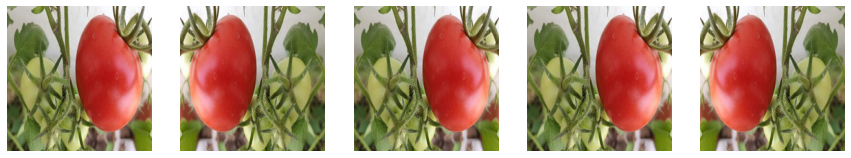

In [27]:
img = load_img('Vegetable Images/train/Tomato/0002.jpg')

# La convierto a un numpy array
img = img_to_array(img)

# Le sumo una dimesion, cuyo valor es cero. 
# De (224, 224, 3) a (224, 224, 3, 0)
# Esto porque la funcion flow para cargar con el iterator la imagen necesita un array de 4 dimensiones como input
img = expand_dims(img, 0)

# ImageDataGenerator brillo
datagen = ImageDataGenerator(horizontal_flip=True)

# Iterator
aug_iter = datagen.flow(img, batch_size=1)

# Numero de imagenes para probar
n_imgs = 5

# Genero las 5 imagenes con su respectivo tamanio
fig, ax = plt.subplots(nrows=1, ncols=n_imgs, figsize=(15,15))

# Grafico las imagenes
for i in range(n_imgs):

	image = next(aug_iter)[0].astype('uint8')
 
	ax[i].imshow(image)
	ax[i].axis('off')

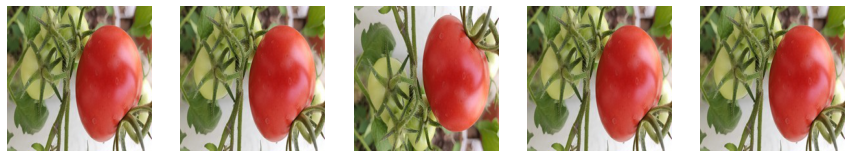

In [28]:
img = load_img('Vegetable Images/train/Tomato/0002.jpg')

# La convierto a un numpy array
img = img_to_array(img)

# Le sumo una dimesion, cuyo valor es cero. 
# De (224, 224, 3) a (224, 224, 3, 0)
# Esto porque la funcion flow para cargar con el iterator la imagen necesita un array de 4 dimensiones como input
img = expand_dims(img, 0)

# ImageDataGenerator brillo
datagen = ImageDataGenerator(vertical_flip=True)

# Iterator
aug_iter = datagen.flow(img, batch_size=1)

# Numero de imagenes para probar
n_imgs = 5

# Genero las 5 imagenes con su respectivo tamanio
fig, ax = plt.subplots(nrows=1, ncols=n_imgs, figsize=(15,15))

# Grafico las imagenes
for i in range(n_imgs):

	image = next(aug_iter)[0].astype('uint8')
 
	ax[i].imshow(image)
	ax[i].axis('off')

### Dataset Visualization

Creo una funcion con la cual visualizo las imagenes y sus respectivas clases. Ademas, sirve para utilizar para predicir la clase de un vegetal y mostar la imagen.

In [29]:
def show_images(TABLA=[5,5], model=None, size=(20,20), data=train_data):

    # Agarro el numero de filas y de columnas con el cual voy a graficar la tabla de imagenes

    n_filas = TABLA[0]
    n_cols = TABLA[1]

    # Indico el numero de imagenes que voy a tener que graficar (columnas * filas)

    n_images = n_cols * n_filas
    
    # Creo un loop con el cual grafico cada imagen con us respectiva clase como titulo
    # El tamaño de cada imagen es pasado por parametro (20 x 20 px)

    # Este loop recorre la data que se le pase por parametro, la cual tiene una estructura en especifico, en la que hay un directorio por cada clase
    # De esta manera selecciona tanto la imagen como el numero de clase de cada imagen
    # La seleccion de clases depende de id, el cual varia aleatoriamente dentro de la cantidad de clases que hay (0 a 15)
    # Finalmente, uno termina con una imagen y el nombre de la clase de la misma (el cual se agarra del array de nombres, usando el numero de clase para seleccionarlo)

    i = 1
    plt.figure(figsize=size)
    for images, labels in data:
        id = np.random.randint(n_classes)
        image, label = images[id], class_names[int(labels[id])]
        
        # Se hace esta "tabla" de imagenes, donde se van acumulando las imagenes

        plt.subplot(n_filas, n_cols, i)
        plt.imshow(image)
        
        # Si no hay un modelo pasado por parametro, se pone como titulo el nombre de la clase de la imagen
        if model is None:
            title = f"Class : {label}"

        # En cambio, si hay un modleo cargado, signifca que podemos hacer predicciones
        # Por lo tanto, predecimos que clase sera utilizando la imagen que esta presente en el for
        # El resultado, el cual es el id de la clase, lo utilizamos para agarrar el nombre de la misma clase
        # Finalmente, ponemos el resultado de la prediccion como titulo, poniendo tanto el resultado correcto (su etiqueta correspondiente), como la prediccion hecha

        else:
            pred = class_names[int(np.argmax(model.predict(image[np.newaxis, ...])))]
            title = f"Org : {label}, Pred : {pred}"

        # Se escriben los titulos de cada imagen

        plt.title(title)
        plt.axis('off')
        
        # Utilizamos a I para controlar el loop de imagenes, una vez que alcance la cantidad de imagenes presentes, se termina

        i+=1
        if i>=(n_images+1):
            break
            
    plt.tight_layout()
    plt.show()

Mostramos 25 imagenes de training, las cuales ya estan augmentadas.

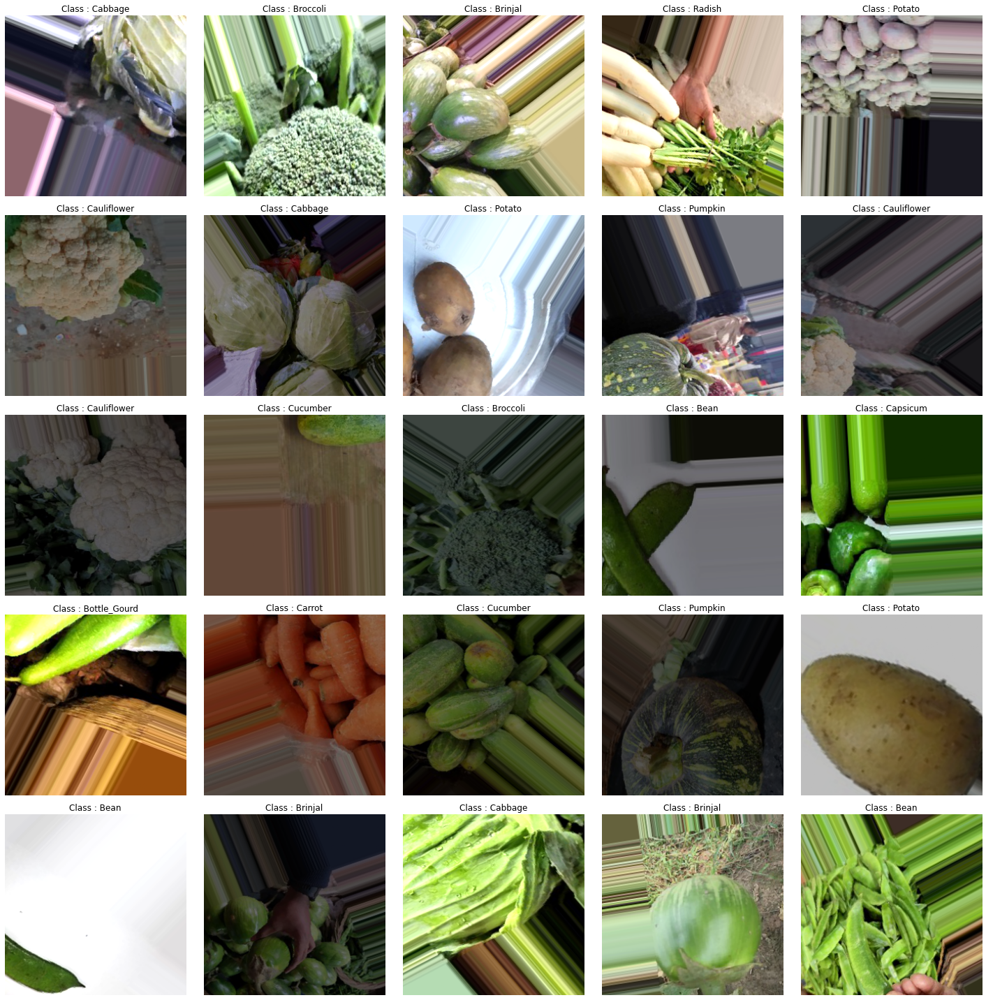

In [30]:
show_images()

### Modelo

#### Teoria y explicacion del funcionamiento

#### Layers

#### `conv2D` *(2D convolution layer)*

Esta capa crea un número de **filtros** en forma de **kernels**, los cuales recorren toda la imagen con la finalidad de **extraer caracteristicas**. Dicho de otra manera, recorre la imagen (la cual esta en forma de tensor), con un cuadrado de un tamaño en especifico (normalmente es de 3x3 o tambien de 2x2), los cuales tienen un valor en especifico por pixel (normalmente valores ya normalizados entre 0 y 1) y el kernel multiplica estos valores por los valores del kernel, creando el **feature map**.


Tiene diversos **parametros configurables**, con el fin de **personalizar** aún más cada convolución. 

- Filters: Cantidad de filtros por convolucion 
- Kernel size: Tamanio del kernel, siempre son dos valores iguales. (2x2, 3x3, etc) 
- Padding: 
>- Valid: Opcion por default, mantiene los valores del vector de igual tamanio, no modifica nada.
>- Same: Crea un contorno de la imagen con todos valores en 0, para lograr que el feature map resultante de la convolucion sea igual en tamanio que el input. De ahi el nombre, ya que mantiene igual (same) el tamanio del input.
>- Full: Crea un contorno aun mayor que en Same, puesto que calcula cuantos contornos necesita para agrandar el input, haciendo que el tamanio del output sea mayor al ingresado

- Strides: Es cada cuantos "bloques" o elementos del array de se desplaza el kernel. En otras palabras, es de a cuantos "bloquecitos" se va moviendo.

#### `Demostracion grafica`

- Input: (9x9)
- Kernel size: (3x3)
- Padding: Valid
- Strides: (1,1)

<img src = 'https://miro.medium.com/max/1320/1*LT0l-KXw5FXIkcGVl-KXlQ.gif'>

Diferencia entre `padding` **VALID**, **SAME** Y **FULL**

`VALID`

<img src = 'https://global.discourse-cdn.com/business6/uploads/analyticsvidhya/original/2X/0/03c1f6ce34af21f30fa91f00d5ba1899dfdcd411.gif'>

`SAME`

<img src = 'https://upload.wikimedia.org/wikipedia/commons/e/ee/Convolution_arithmetic_-_Same_padding_no_strides.gif'>

`FULL`

<img src = 'https://upload.wikimedia.org/wikipedia/commons/0/06/Convolution_arithmetic_-_Full_padding_no_strides.gif'>

Demostracion del funcionamiento a nivel arimetico del kernel

<img src = 'https://i.stack.imgur.com/xdXTn.gif'>

Otra demostracion del funcionamiento, en este caso, se puede destacar el tipo de padding, el cual es same.

<img src = 'https://jehyunlee.github.io/2020/11/29/Python-DL-1-conv2d/keras_conv2d_padding.gif'>

<img src = 'https://miro.medium.com/max/1320/1*DTTpGlhwkctlv9CYannVsw.gif'>

[Pagina de kernel] (https://setosa.io/ev/image-kernels/)

####`MaxPooling2D`

Es un **kernel** el cual recorre el array de la misma manera que un kernel de una capa convolucional, simplemente que normalmente es de un **menor tamaño** (2x2) y cumple con **otra funcion**. Primero hay que definir que es una capa del tipo `pool`. 

Estas capas se suelen utilizar para ir **achicando el tamaño del array**, ya que el kernel va seleccionando los **pixeles correspondientes**, y segun su tipo de `pool`, **simplifica** la imagen de diversas maneras:






- Max: Selecciona el valor maximo de los pixeles seleccionados. Por ejemplo, si selecciona 4 pixeles con el siguiente valor **[24, 51, 19, 164]**, el resultado del pool va a ser **[164]**. Por lo tanto, esos *4 pixeles se reducen en solo 1*, con ese valor.

<img src='http://androidkt.com/wp-content/uploads/2021/06/max-pooling.png'>

- Average: Selecciona los valores y hace un promedio de estos mismos. Por ejemplo, si selecciona los siguientes 4 valores **[28, 184, 70, 38]**, nos daria como resultado **[80]**

<img src="https://production-media.paperswithcode.com/methods/Screen_Shot_2020-05-24_at_1.51.40_PM.png"> 

- Global Average o Max: El tipo global tiene dos subtipos, tanto el max como el global. Lo que modifica que sea global es que le aplica el efecto a todos los pixeles.

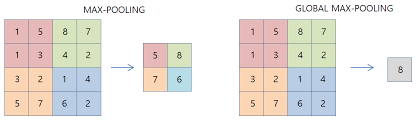

#### `Funciones de Activacion`

- `ReLU` *(Rectified Lineal Unit)*
Utilizamos funciones de activacion el fin de poder activar las neuronas y obtener el output de las mismas

ReLU normaliza todos los valores negativos a 0, mientras que los positivos lo mantiene igual.

In [31]:
def ReLU(x):
  return (np.maximum(0.0,x))

In [32]:
print(ReLU(-3), ReLU(5), ReLU(0))

0.0 5.0 0.0


In [33]:
# Data para el grafico

# Los valores del eje X (Del -10 al 10)
x_data = np.linspace(-10,10,100)

# Los resultados en Y de los valores de X aplicandole ReLU
y_data = ReLU(x_data)

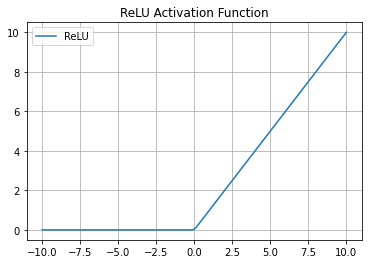

In [34]:
# Graph
plt.plot(x_data, y_data, label = 'ReLU')
plt.title('ReLU Activation Function')
plt.legend(loc = 'upper left')
plt.grid()
plt.show()

#### `Softmax`

La funcion de activación softmax es similar en su forma a la relu pero tienen una diferencia clave, la **relu es 0 para valores de x menores a 0** y para **valores mayores a 0 X=Y**. Por otro lado la softmax tiene una forma mucho mas similar a una funcion exponencial, para **valores que tienden a infinito negativo, el valor es infinitamente cercano a 0** y para **valores majores a 0 la formula se comporta similar a una exponencial** ya que es una curva que **cuanto mas cerca está de infinito positivo mas cerca a infinito es el valor de Y** pero **a diferencia de la relu X no es igual a Y** para valores mayores a 0, sino que los valores de Y son mayores a los de X. 

In [35]:
from numpy import exp

In [36]:
def softmax(x):
    """Compute softmax values for each sets of scores in x."""
    e_x = np.exp(x - np.max(x))
    return e_x / e_x.sum(axis=0)

In [37]:
print((softmax(0.5), softmax(15), softmax(-1)))

(1.0, 1.0, 1.0)


In [38]:
# Data para el grafico

# Los valores del eje X (Del -10 al 10)
x_data = np.linspace(-10,10,100)

# Los resultados en Y de los valores de X aplicandole softmax
y_data = softmax(x_data)

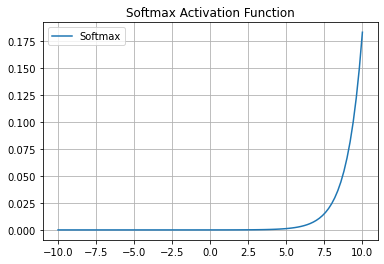

In [39]:
# Graph
plt.plot(x_data, y_data, label = 'Softmax')
plt.title('Softmax Activation Function')
plt.legend(loc = 'upper left')
plt.grid()
plt.show()

####`Flatten`

Es una funcion que transforma un **array de 2 o mas dimensiones** a un array de **1 sola dimension**. Se suele utilizar en conjunto con capas densas.

`Ejemplo Grafico`

<img src = 'https://sds-platform-private.s3-us-east-2.amazonaws.com/uploads/73_blog_image_1.png'> [Flatten](https://)

#### `Dropout`

La función `dropout` sirve para **desabilitar** o, justamente, "dropear" algunas neuronas en intervalos de tiempo definidos con el objetivo de que no todas las neuronas se entrenen con todas las imagenes, **esto evita que se sobreentrene la IA** o mas bien conocido como **"overfitting"** y termine reconociendo solo imagnees muy similares a las imagenes con las que fue entrenada. 

#### Demostracion Grafica

<img src = 'https://i.stack.imgur.com/c2O5w.png'>

#### `Underfitting vs Overfitting`

`Underfitting:` Es cuando en el **entrenamiento** o la etapa de **training** el modelo de IA se **sobregeneraliza** a causa de los **pocos datos** de calidad de entrenamiento utilizados. Por lo tanto, el **error** tanto testeado como en los datos de training tiende a ser muy alto.

En otras palabras, es cuando el modelo es incapaz de poder detectar estos patrones caracteristicos que el permiten clasificar o identificar aquellas cosas deseadas.

`Overfitting:` Es cuando en el entrenamiento o la etapa de training debido a un **sobreentreno** del mismo, el modelo empieza a **sobreajustarse** a los datos de entrenamiento, puesto que estos son los que utliza para aprender. Por lo tanto, el modelo empieza a tender a ser **muy especifico** y **muy poco generalizado**, ya que aprendio a **detectar perfectamente** todos los **patrones de los datos de entrenamiento**. Sin embargo, cuando los **datos varian**, y estos son datos que nunca vio, es cuando el modelo **empieza a fallar**, ya que es incapaz de detectar los patrones que antes si lograba.
 
Dicho de otra manera, todos aquellos casos donde no sea tan facil detectar o predicir lo que buscamos, donde haya una especie de **"gris"**, y el modelo trata de buscarle una **explicacion forzada**, la cual muy posiblemente termine siendo **erronea**, lo que causa que el modelo **arrastre este error** y utilice esta caracteristica como **criterio** de clasificacion o prediccion. Esto provoca que este criterio, el cual es erroneo, se aplique a todos los casos, dando muy **malos resultados**. Basicamente, **no es constante** con sus resultados en diferentes tipos de datos.

Ejemplo con una analogia: Digamos que no sabemos el sabor de una manzana, por lo que la primera vez que comemos una roja y vemos que es dulce, pensamos automaticamente que todas las manzanas rojas son dulces. Del mismo modo, cuando probemos una verde, pensaremos que todas las verdes son amargas, debido al gusto de la primera. Sin embargo, todos sabemos que no siempre todas las manzanas rojas son dulces, al igual que no todas las verdes son amargas, creando asi una especie de gris. Por lo tanto, cuando probamos una manzana roja la cual su sabor es amargo, la caracteristica del color deja de ser determinamente y util, por lo que empieza a determinar el sabor por otra caracteristica. Por ejemplo, como todas las manzanas rojas dulces que probo fueron siempre a la maniana, y esta fue a la tarde, determina que todas las manzanas rojas amargas que pruebe seran porque las come en la tarde, cosa claramente incorrecta. Por lo tanto, empieza a utilizar el factor del tiempo como criterio, utilizando con otros datos con los que no tiene el mismo impacto positivo. 

Graficos los cuales sirven de demostracion grafica de todo lo explicado.

<img src = 'https://www.aprendemachinelearning.com/wp-content/uploads/2017/12/generalizacion-machine-learning.png'>

Se observa que el modelo con overfitting logra resolver la tarea de manera excelente, pero que cuando se le aplique un nuevo caso sera incapaz de resolver con tal acierto.

Del mismo modo, vemos que el modelo con underfitting nos propone una resolucion muy simple y plana, la cual es insuficiente como para decir que es correcta.

Finalmente, el modelo mas equilibrado es el del medio, el cual logra resolver el problema adecuadamente, sabiendo que tiene un grado de error, pero es constante con cualquier tipo de dato.

<img src = 'https://media.geeksforgeeks.org/wp-content/cdn-uploads/20190523171258/overfitting_2.png'>::::::::::::

Este es un grafico muy descriptivo, puesto que observamos las mediciones de error en los datos de entrenamiento y de testeo. Cuando mas se entrena el modelo, mas tiende a sobreajustarse o a tender a ser muy especifico, es por eso que el error de entrenamiento decrece con el tiempo, ya que se ajusta excesivamente para atinar correctamente a los datos de entrenamiento. Sin embargo, producto de este sobreajuste, el modelo es incapaz de generalizar sus criterios como para poder detectar correctamente los datos que nunca vio y nunca pudo sacar caracteristicas, los cuales son los de testeo. Es por eso la diferencia de errores en el caso de overfitting.

En cambio, en el underfitting, observamos que es incapaz de poder obtener buenos resultados del error, por lo que es evidente que no es lo suficientemente apto como para poder extraer conclusiones y caracteristicas que sean determinantes para el resultado, por lo que empieza a generalizar ante la falta de criterio.

<img src = 'https://vitalflux.com/wp-content/uploads/2020/12/overfitting-and-underfitting-wrt-model-error-vs-complexity.png'>

#### `Input shape`

Son las **dimensiones** de las imagens que pasamos para entrenar al modelo, especificamente su tamaño es de **256x256** y el numero 3 se refiere a la cantidad de valores dentro de cada array de un pixel, uno para cada color del espectro **RGB**. 

In [40]:
model = Sequential()
model.add(Conv2D(filters = 32, kernel_size = (3, 3), input_shape=(256, 256, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(filters = 32, kernel_size = (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(filters = 64, kernel_size = (3, 3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())  # this converts our 3D feature maps to 1D feature vectors 
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(n_classes, activation = 'softmax'))

In [41]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 32)      896       
                                                                 
 activation (Activation)     (None, 254, 254, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 32)      9248      
                                                                 
 activation_1 (Activation)   (None, 125, 125, 32)      0         
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 32)       0         
 2D)                                                    

#### Graficos del modelo

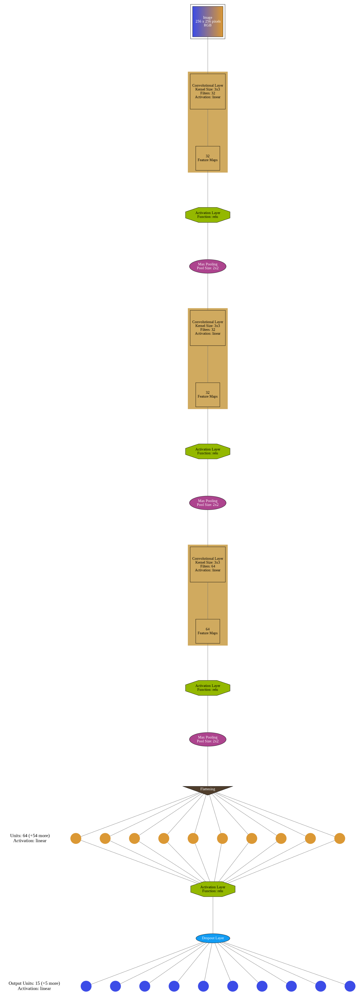

In [42]:
filename = 'CNN Vegetable Classification'

visualizer(model, format='png', filename=filename, view=True)

filepath = filename + '.png'

img = cv2.imread(filepath)

plt.figure(figsize=(30,100))
plt.imshow(img)
plt.axis("off")
plt.show()

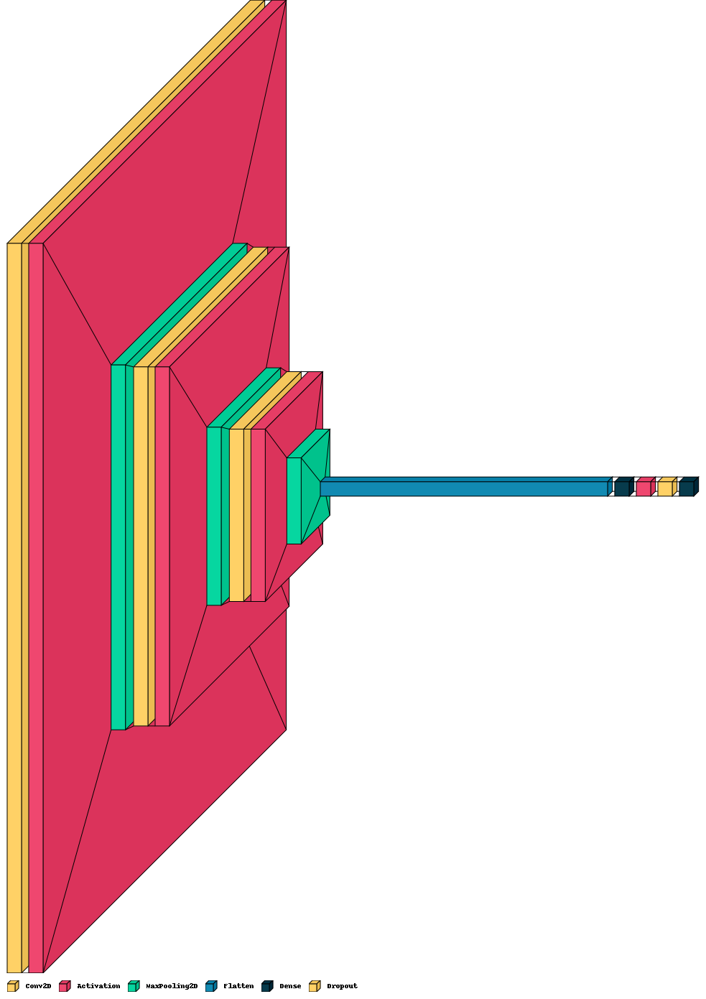

In [43]:
visualkeras.layered_view(model, legend=True)

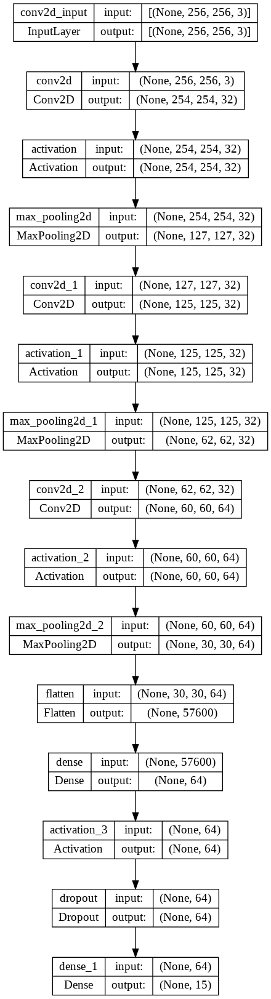

In [44]:
plot_model(model, 'net.png', show_shapes=True)

#### Configuraciones del modelo

#### `Loss`

La función que mide el error de cada epoch de entrenamiento y que segun el grado de error, se ajustan los valores de los weights. Se suelen utiilizar los siguentes:

- Mean square error (MAE)
- Sparse categorical crossentropy
- BinaryCrossentropy


#### `Optimizer`

Es un **algoritmo** que maximiza la **eficacia** de lo que se aprende por cada epoch, esto lo hace al evaluar los resultados e ir **modificando los weights y el learn rate** para tener que hacer una menor cantidad de epochs e igual conseguir un resultado favorable. 


#### `Metrics`

Mide el error del modelo, igual que loss, simpelemente que se utiliza para evaluar el **rendiemiento general** del modelo. Es un inicativo que nos sirve a nosotros para observar la **precision** del mismo


In [45]:
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

Es una funcion **callback** la cual **detiene el modelo** de manera **anticipada** cuando observa que **no hay mejoras**. Esto lo mide utilizando el parametro de `val_loss`, el cual indica el error de los datos de validacion. Cuando no mejora un numero especifico (en este caso 0.001) por una cierta cantidad de ephocs seguidas (en este caso 10), detiene el modelo y devuelve los mejores weights de toda las epochs.

In [46]:
early_stopping = EarlyStopping(
    min_delta=0.001, # minimium amount of change to count as an improvement
    patience=10, # how many epochs to wait before stopping
    restore_best_weights=True
)

Voy **guardando los resultados** del entrenamiento utilizando una funcion **callback** en una carpeta, los cuales cada resultado estan guardados y archivados segun el Anio, Mes, Dia, Hora, Minuto y Segundo.

In [47]:
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)

Mediante el uso de esta funcion **callback**, logro guardar los **weights** del modelo por **cada epoch**, siempre y cuando **mejore** en `val_loss`.

In [48]:
filepath = 'my_best_model.epoch{epoch:02d}-loss{val_loss:.2f}.hdf5'
model_checkpoint = ModelCheckpoint(filepath=filepath,
                                   monitor='val_loss',
                                   verbose=1,
                                   save_best_only=True)

Creo una lista de todas las funciones callbacks que voy a utilizar durante el entranemiento

In [49]:
cbs = [early_stopping, tensorboard_callback, model_checkpoint]

#### `Epoch`

Una Epoch es cuando el modelo de IA logra dar una **vuelta completa al dataset**. Es decir, cuando lo **recorre completamente**. En cada epoch se hace un **ciclo** de entrenamiento, una iterando por cada grupo de imagenes que se designe (el batch size). Luego, se calcula el margen de **error**, el cual es posible de calcular de diversas maneras. 

Por ejemplo, una de ellas es la fórmula de mean square error (error cuadrático) que calcula el promedio de los errores y los potencia al cuadrado. 

Este margen de error luego se usa para **modificar los weights** y así mejorar el rendimiento de la IA. 


####`Batch size`

Debido a que por temas de **memoria y de hardware**, es casi imposible recorrer el dataset completamente de una, se lo suele **dividir en partes**, para poder manejar mejor este problema. Esto es el batch size, es una **fraccion de datos** del dataset de entrenamiento original. 


Demostracion grafica de ambos conceptos

<img src = 'https://miro.medium.com/max/1010/1*AOiD8LEDWrWy5l_f9qgweQ@2x.jpeg'>

Entreno al modelo, con los siguientes parametros:

- 50 Epochs
- 512 Batch Size
- Los Callbacks previamente mencionados

In [ ]:
hist = model.fit(train_data, validation_data = valid_data, epochs=50, batch_size = 512, callbacks=cbs)

Epoch 1/50
469/469 [==============================] - ETA: 0s - loss: 0.8590 - accuracy: 0.7309
Epoch 1: val_loss improved from inf to 0.61115, saving model to my_best_model.epoch01-loss0.61.hdf5
469/469 [==============================] - 312s 661ms/step - loss: 0.8590 - accuracy: 0.7309 - val_loss: 0.6111 - val_accuracy: 0.8047
Epoch 2/50
469/469 [==============================] - ETA: 0s - loss: 0.8286 - accuracy: 0.7378
Epoch 2: val_loss improved from 0.61115 to 0.56395, saving model to my_best_model.epoch02-loss0.56.hdf5
469/469 [==============================] - 299s 637ms/step - loss: 0.8286 - accuracy: 0.7378 - val_loss: 0.5639 - val_accuracy: 0.8393
Epoch 3/50
469/469 [==============================] - ETA: 0s - loss: 0.8322 - accuracy: 0.7354
Epoch 3: val_loss improved from 0.56395 to 0.53603, saving model to my_best_model.epoch03-loss0.54.hdf5
469/469 [==============================] - 294s 628ms/step - loss: 0.8322 - accuracy: 0.7354 - val_loss: 0.5360 - val_accuracy: 0.8357

In [ ]:
# Grafico la loss y la precision del modelo
h = hist.history
plt.style.use('ggplot')
plt.figure(figsize=(10, 5))
plt.plot(h['loss'], c='red', label='Training Loss')
plt.plot(h['val_loss'], c='red', linestyle='--', label='Validation Loss')
plt.plot(h['accuracy'], c='blue', label='Training Accuracy')
plt.plot(h['val_accuracy'], c='blue', linestyle='--', label='Validation Accuracy')
plt.xlabel("Number of Epochs")
plt.legend(loc='best')
plt.show()

In [ ]:
%load_ext tensorboard

In [ ]:
%tensorboard --logdir logs/fit

Reusing TensorBoard on port 6006 (pid 126), started 0:00:38 ago. (Use '!kill 126' to kill it.)

<IPython.core.display.Javascript object>

### Evaluacion

Agarro de un archivo de my Drive, los **weights de la mejor epoch** de todas las que entrene.

In [50]:
path_best_model = 'gdrive/MyDrive/ORT/TIC/T.E/best_model.hdf5'

**Cargo** esos weights y **evaluo su performance** con las imagenes de testeo

In [51]:
model.load_weights(path_best_model)

loss, accuracy = model.evaluate(test_data, verbose=2)
print("Modelo, precision: {}%".format(100 * accuracy))

94/94 - 56s - loss: 0.4063 - accuracy: 0.8697 - 56s/epoch - 595ms/step
Modelo, precision: 86.96666955947876%


Testeo el modelo con los weights actualizados con algunas imagenes de testeo.

Org: Tipo de vegetal original, el correcto

Pred: Prediccion del modelo

1/1 [==============================] - 0s 40ms/step


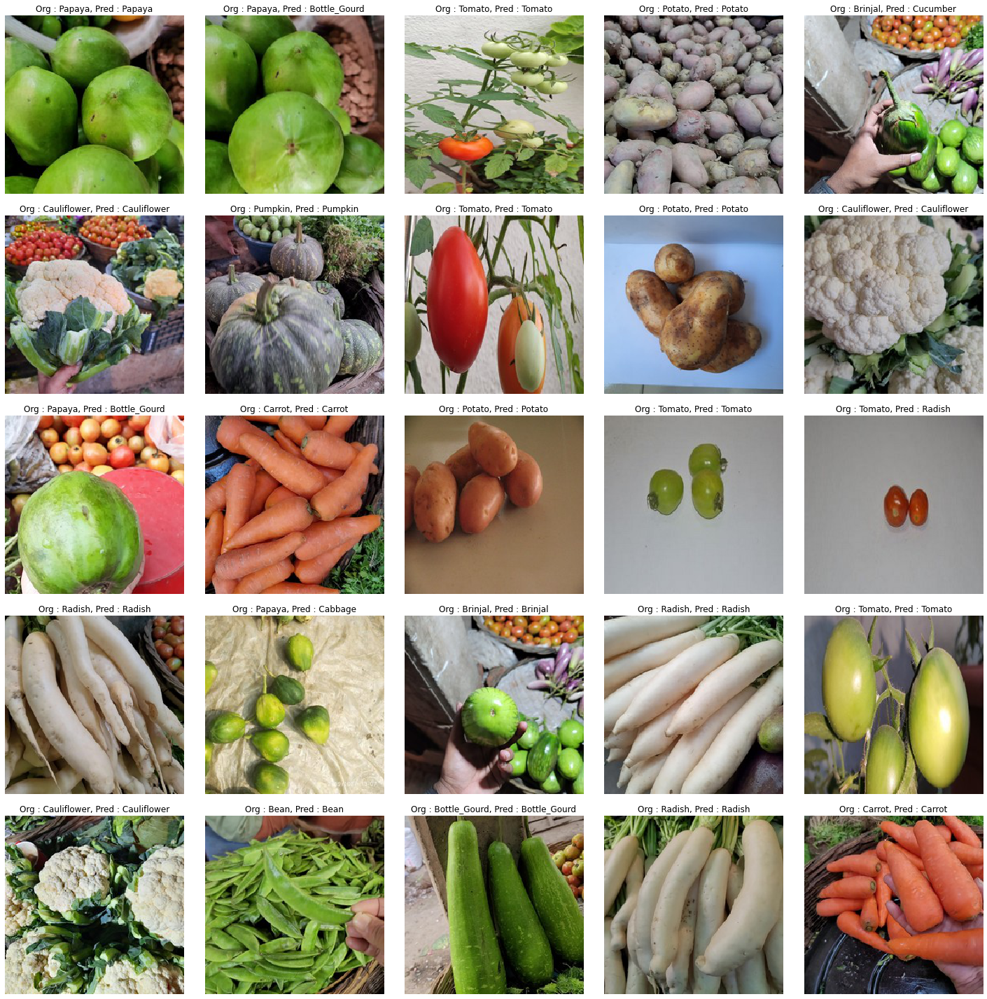

In [52]:
show_images(model=model, data=test_data)